UP206a Midterm by the Mangonadas: Andres and Dani
Our research question: Are communities that are proximate to environmental health hazards more policed than those not exposed to environmental health hazards?

This project intends to examine the intersections between proximity to environmental hazards and policng because environmental risks could indicate increased susceptibility to developing sociobehavioral issues deemed as deviant.

#This question is important because polluted communities could be doubly vulnerable given their immediate social and physical conditions, making them subject to policing of their behaviors.

#To explore our question, we are using census tract data from 2012, the LA City Geohub Environmental Justice Screening Method data, and crime data, to examine reports of arrest in Los Angeles. 

In [1]:
#Import packages
import geopandas as gpd
import pandas as pd
import plotly.express as px
from sodapy import Socrata
import folium
import matplotlib
import matplotlib.pyplot as plt

In [2]:
#Read in EJSM df and make string of tracts to be named
df = pd.read_csv(
'Data/EJSM_Scores/EJSM_Scores (1).csv' ,
dtype={
    'Tract_1':str
})

In [3]:
#Add number zero leading the FIPS code for merging the data with the census tract data
df['Tract_1'] = df['Tract_1'].str.zfill(11)
df.head()

,OBJECTID,Tract_1,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length
0,1,06037920336,10,3,1,4,2,2.438560e+06,8124.373091
1,2,06037920044,4,1,1,1,1,1.470811e+06,5545.298452
2,3,06037573003,13,5,3,3,2,6.528168e+05,3310.743793
3,4,06037571704,13,3,2,4,4,6.994011e+05,4113.477175
4,5,06037570403,17,5,3,5,4,8.317839e+05,3887.000394


In [4]:
#Import 2012 census data
tracts=gpd.read_file('Data/CensusData2012/census-tracts-2012.geojson')
print(tracts)

                     kind  external_id         name  \
0     Census Tract (2012)  06037101110  06037101110   
1     Census Tract (2012)  06037101122  06037101122   
2     Census Tract (2012)  06037101210  06037101210   
3     Census Tract (2012)  06037101220  06037101220   
4     Census Tract (2012)  06037101300  06037101300   
...                   ...          ...          ...   
2341  Census Tract (2012)  06037980031  06037980031   
2342  Census Tract (2012)  06037980033  06037980033   
2343  Census Tract (2012)  06037990100  06037990100   
2344  Census Tract (2012)  06037990200  06037990200   
2345  Census Tract (2012)  06037990300  06037990300   

                               slug                                    set  \
0     06037101110-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
1     06037101122-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
2     06037101210-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
3     06037101220-census-tr

In [5]:
#List column names 
list(tracts)

['kind',
 'external_id',
 'name',
 'slug',
 'set',
 'metadata',
 'resource_uri',
 'geometry']

In [6]:
#Select unwanted columns
columns_to_drop = ['set','kind','resource_uri','metadata']
#read columns 
tracts.head()

,kind,external_id,name,slug,set,metadata,resource_uri,geometry
0,Census Tract (2012),06037101110,06037101110,06037101110-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2594737', 'NAME': '1011.10',...",/1.0/boundary/06037101110-census-tract-2012/,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,Census Tract (2012),06037101122,06037101122,06037101122-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2677213', 'NAME': '1011.22',...",/1.0/boundary/06037101122-census-tract-2012/,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,Census Tract (2012),06037101210,06037101210,06037101210-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2529724', 'NAME': '1012.10',...",/1.0/boundary/06037101210-census-tract-2012/,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,Census Tract (2012),06037101220,06037101220,06037101220-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2516085', 'NAME': '1012.20',...",/1.0/boundary/06037101220-census-tract-2012/,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,Census Tract (2012),06037101300,06037101300,06037101300-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2487732', 'NAME': '1013', 'I...",/1.0/boundary/06037101300-census-tract-2012/,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [7]:
#Drop unnecessary columns from tracts data
tracts = tracts.drop(columns_to_drop,axis=1)

In [8]:
#Show tracts info
tracts.info(verbose=True, null_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   external_id  2346 non-null   object  
 1   name         2346 non-null   object  
 2   slug         2346 non-null   object  
 3   geometry     2346 non-null   geometry
dtypes: geometry(1), object(3)
memory usage: 73.4+ KB


In [9]:
#Isolate the FIPS code and geometry columns to match with the EJSM data
tracts = tracts[['name','geometry']]
tracts.head()

,name,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [10]:
#Show isolated columns
tracts.columns = ['FIPS','geometry']
tracts.head()

,FIPS,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [11]:
#Rename Tract_1 to FIPS
df.columns = ['OBJECTID',
 'FIPS',
 'CIscore',
 'HazScore',
 'HealthScore',
 'SVscore',
 'CCVscore',
 'Shape__Area',
 'Shape__Length']
df.head()

,OBJECTID,FIPS,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length
0,1,06037920336,10,3,1,4,2,2.438560e+06,8124.373091
1,2,06037920044,4,1,1,1,1,1.470811e+06,5545.298452
2,3,06037573003,13,5,3,3,2,6.528168e+05,3310.743793
3,4,06037571704,13,3,2,4,4,6.994011e+05,4113.477175
4,5,06037570403,17,5,3,5,4,8.317839e+05,3887.000394


In [12]:
#This section will explore the merged data

In [13]:
#List new df columns
list(df)

['OBJECTID',
 'FIPS',
 'CIscore',
 'HazScore',
 'HealthScore',
 'SVscore',
 'CCVscore',
 'Shape__Area',
 'Shape__Length']

In [14]:
#Merge data on the same object FIPS
tracts_ejsm=tracts.merge(df,on="FIPS")
#Show merge with census data
tracts_ejsm.head()
tracts_ejsm.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2342 entries, 0 to 2341
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   FIPS           2342 non-null   object  
 1   geometry       2342 non-null   geometry
 2   OBJECTID       2342 non-null   int64   
 3   CIscore        2342 non-null   int64   
 4   HazScore       2342 non-null   int64   
 5   HealthScore    2342 non-null   int64   
 6   SVscore        2342 non-null   int64   
 7   CCVscore       2342 non-null   int64   
 8   Shape__Area    2342 non-null   float64 
 9   Shape__Length  2342 non-null   float64 
dtypes: float64(2), geometry(1), int64(6), object(1)
memory usage: 201.3+ KB


In [15]:
tracts_ejsm.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [16]:
#Describe stats by proximity to hazard score
tracts_ejsm['CIscore'].describe()

count    2342.000000
mean       12.007259
std         4.352322
min         0.000000
25%         9.000000
50%        12.000000
75%        15.000000
max        20.000000
Name: CIscore, dtype: float64

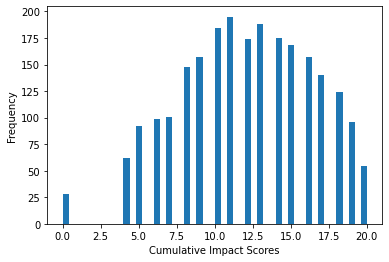

In [17]:
#Plot histogram for cumulative impact score
tracts_ejsm['CIscore'].plot.hist(bins=50),
plt.xlabel('Cumulative Impact Scores')
plt.ylabel('Frequency'),
plt.savefig('CIscore.png')

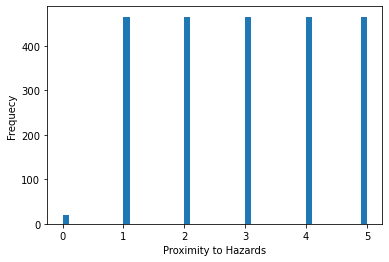

In [18]:
#Plot histogram for proximity to hazard score. It is grouped by the number of occurences. 
#Our not so great graph! Seeing this bar chart intrigued us to durther explore the variations between census tracts.
tracts_ejsm['HazScore'].plot.hist(bins=50)
plt.xlabel('Proximity to Hazards')
plt.ylabel('Frequecy'),
plt.savefig('HazScore_bar.png')

It’s unclear why the hazard score data is not distributed the same way as the cumulative impact score data. We wondered if it was because we had miswritten it or if the hazard occurrences were not visible on this bar graph. What is apparent is the average cumulative impact score of LA lying somewhere between 10.5-12.5. The cumulative score considers all the scores identified from the dataset included proximity to hazards, social vulnerability, climate vulnerability, and health vulnerability. 

In [19]:
#New object to show the sorted data- these are the top polluted census tracts. The census tracts that are shown as being the most polluted are also the most socially vulnerable.
tracts_ejsm_sorted = tracts_ejsm.sort_values(by='CIscore',ascending = False)
tracts_ejsm_sorted[['FIPS','CIscore','HazScore','SVscore']].head(10)

,FIPS,CIscore,HazScore,SVscore
1325,06037433501,20,5,5
1530,06037530301,20,5,5
594,06037211922,20,5,5
532,06037206032,20,5,5
533,06037206050,20,5,5
660,06037219300,20,5,5
581,06037211310,20,5,5
672,06037221302,20,5,5
719,06037228900,20,5,5
1637,06037535605,20,5,5


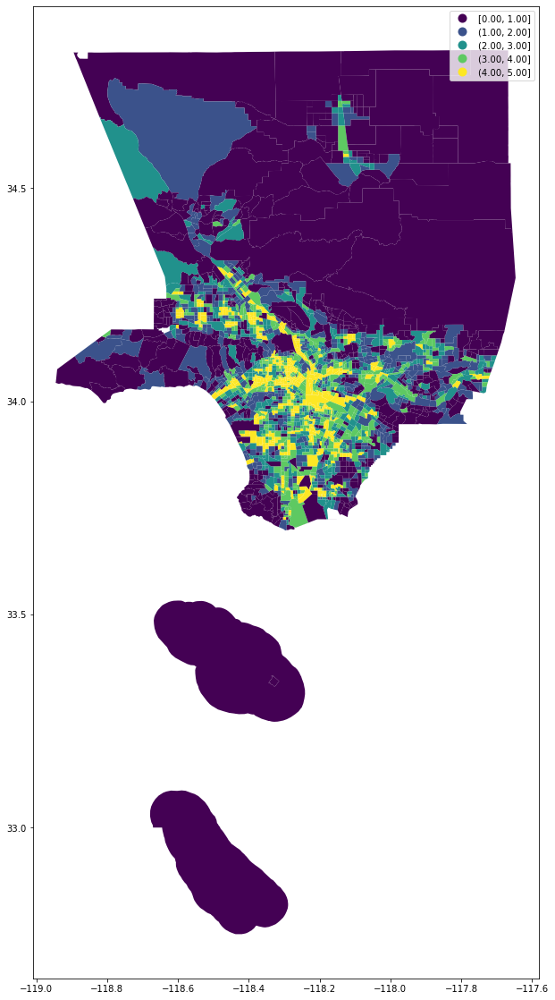

In [20]:
#Plot represents the proximity to environmental hazards score by equal intervals 
#We can see that the most polluted areas are in south central LA county 
tracts_ejsm.plot(figsize=(24,20),
                 column='HazScore',
                 legend=True, 
                 scheme='equal_interval')

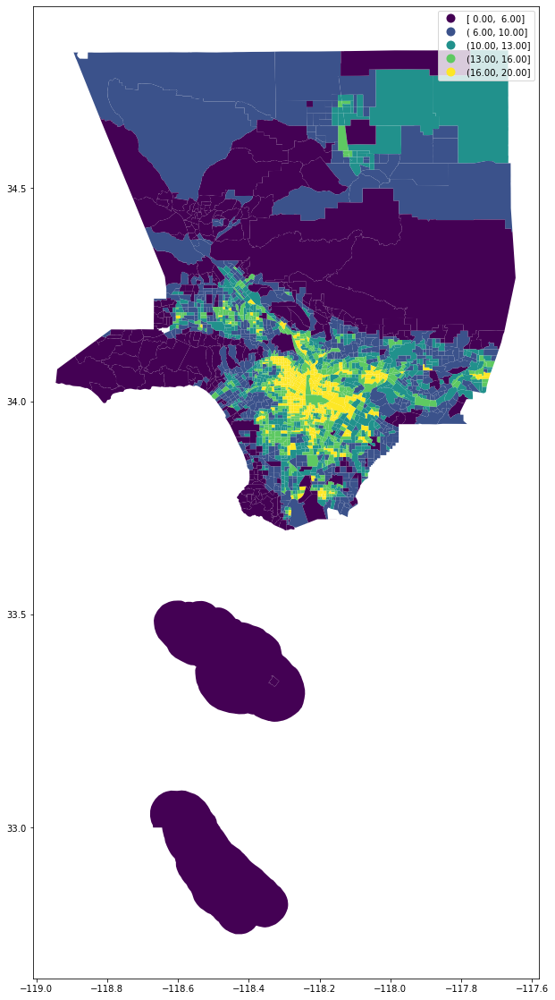

In [21]:
#Plot represents the cumulative impact scores separated by natural breaks
#The map shows increased variation because of the integrated scores
tracts_ejsm.plot(figsize=(24,20),
                 column='CIscore',
                 legend=True, 
                 scheme='NaturalBreaks')

In [22]:
#Folium map for HazScore. This score will be our main point of analysis

m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  geo_data=tracts_ejsm, # geo data
                  data=tracts_ejsm, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'HazScore'], # [key, value]
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Degree of proximity to Environmenta Hazards)').add_to(m)
m


This Chloropleth map provides us with a background map that will kick off the rest of our work. We chose hazard scores because while the cumulative impact was meaningful, we wanted to focus on a standard that could be more decisively measured (proximity to environmental hazards in the form of pollutants) rather than other measurements. Measurements include a social vulnerability that could be more skewed based on indicators defined by the source (in this case, USC/Occidental College). For example, although poverty and policing can be linked, we wanted to see if sites that were contaminated or close to toxic sites (such as Exide) would have a significant relationship to policing.

In [23]:
#Importing our arrest 2020 data using an API
client = Socrata("data.lacity.org", None)
results = client.get("amvf-fr72", limit=10000)
df =pd.DataFrame.from_records(results)

In [24]:
#Sample data to check for inconsistencies
df.sample(7)

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,bkg_date,:@computed_region_ur2y_g4cx,bkg_time,:@computed_region_kqwf_mjcx,bgk_location,:@computed_region_2dna_qi2s,bkg_loc_cd,dispo_desc
7579,6015455,BOOKING,2020-09-19T00:00:00.000,1850,13,Newton,1325,25,M,H,...,708,971,2020-09-19T00:00:00.000,7,2004,13,77TH ST,6,4212,FELONY COMPLAINT FILED
1382,201511993,RFC,2020-06-26T00:00:00.000,1020,15,N Hollywood,1513,29,M,H,...,180,1503,NaN,NaN,NaN,5,NaN,71,NaN,MISDEMEANOR COMPLAINT FILED
9006,201711288,RFC,2020-07-17T00:00:00.000,2300,17,Devonshire,1797,29,M,H,...,120,422,NaN,NaN,NaN,2,NaN,88,NaN,MISDEMEANOR COMPLAINT FILED
1230,5948469,BOOKING,2020-06-04T00:00:00.000,0320,14,Pacific,1431,35,M,B,...,909,1132,2020-06-04T00:00:00.000,10,0417,10,PACIFIC,30,4214,DISTRICT ATTORNEY REJECT
6583,201711205,RFC,2020-07-01T00:00:00.000,1840,17,Devonshire,1735,29,M,W,...,79,1533,NaN,NaN,NaN,2,NaN,79,NaN,MISDEMEANOR COMPLAINT FILED
3807,200812010,RFC,2020-07-16T00:00:00.000,1125,08,West LA,0884,60,M,W,...,889,1128,NaN,9,NaN,10,NaN,50,NaN,MISDEMEANOR COMPLAINT FILED
1730,5973706,BOOKING,2020-07-17T00:00:00.000,1944,03,Southwest,0397,21,M,H,...,733,1153,2020-07-17T00:00:00.000,7,2120,13,77TH ST,2,4212,849(B)(1) PC/TECHNICAL ARREST


In [25]:
#Get description of arrest data 
df.grp_description.unique()

array(['Robbery', nan, 'Liquor Laws', 'Aggravated Assault',
       'Prostitution/Allied', 'Narcotic Drug Laws',
       'Driving Under Influence', 'Gambling', 'Burglary', 'Drunkeness',
       'Vehicle Theft', 'Miscellaneous Other Violations',
       'Other Assaults', 'Against Family/Child', 'Fraud/Embezzlement',
       'Weapon (carry/poss)', 'Moving Traffic Violations',
       'Disorderly Conduct', 'Forgery/Counterfeit', 'Homicide',
       'Receive Stolen Property', 'Non-Criminal Detention', 'Larceny',
       'Rape', 'Sex (except rape/prst)', 'Disturbing the Peace',
       'Pre-Delinquency'], dtype=object)

In [26]:
#Examining all data types in the df for floats
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   rpt_id                       10000 non-null  object
 1   report_type                  10000 non-null  object
 2   arst_date                    10000 non-null  object
 3   time                         10000 non-null  object
 4   area                         10000 non-null  object
 5   area_desc                    10000 non-null  object
 6   rd                           10000 non-null  object
 7   age                          10000 non-null  object
 8   sex_cd                       10000 non-null  object
 9   descent_cd                   10000 non-null  object
 10  chrg_grp_cd                  9308 non-null   object
 11  grp_description              9308 non-null   object
 12  arst_typ_cd                  10000 non-null  object
 13  charge                       100

In [27]:
#Plotly bar graph to examine the total arrests by LAPD in 2020- NEED TO SAVE AS HTML
px.bar(df,
       x='arst_date',
       title='LAPD Arrests in 2020',
       labels={'arst_date':'Arrest date','counts':'Number of arrests'}
      )

This has been a graph circulating, but it’s interesting to note how arrests boom in the summer months and the moments leading up to it due to the uprisings. What would these look like across time? When hearing about the ‘92 uprising, a familiar anecdote is how heat and power shortages aggravated communities already frustrated and fed up with the policing system. While it’s hard to test this, it’s important to note how many people, particularly folks of color, we’re stuck at home due to quarantine during summer, and many lacked air conditioning (or income to pay for utilities).

In [28]:
#Index arrest charge value counts
arrest_by_charge = df.grp_description.value_counts().reset_index()
arrest_by_charge

,index,grp_description
0,Aggravated Assault,1577
1,Miscellaneous Other Violations,1381
2,Driving Under Influence,996
3,Other Assaults,909
4,Narcotic Drug Laws,860
5,Vehicle Theft,678
6,Weapon (carry/poss),518
7,Burglary,448
8,Robbery,327
9,Larceny,255


In [29]:
#Configure geometry for crime geodataframe
crime = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lon, df.lat))

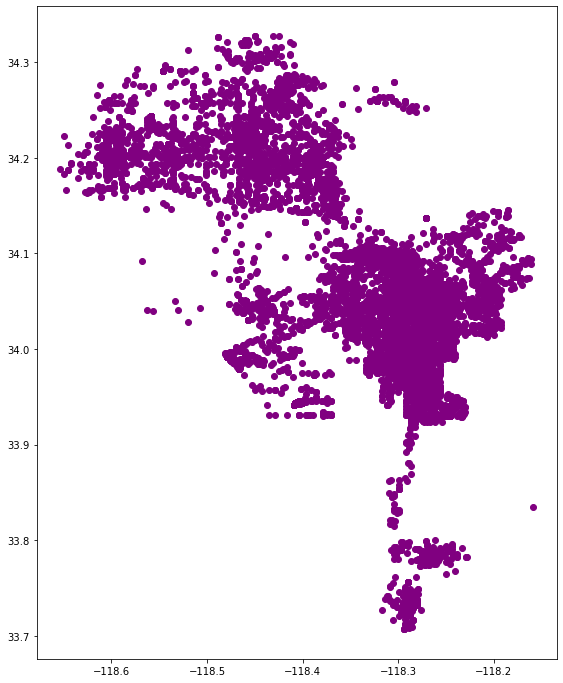

In [30]:
#Scatterplot of crime data
crime.plot(figsize=(12,12),color='purple')

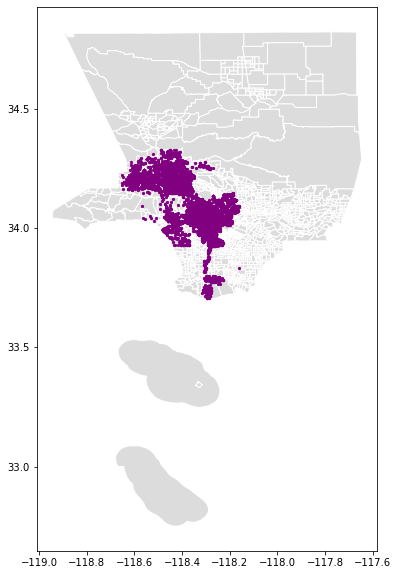

In [31]:
#Add base from tracts data
base = tracts_ejsm.plot(figsize=(12,10),color='gainsboro', edgecolor='white')

ax = crime.plot(ax=base, color='purple', markersize=5)

In [32]:
#Print total bounds of data points 
minx, miny, maxx, maxy = crime.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-118.6536
-118.1589
33.707
34.3274


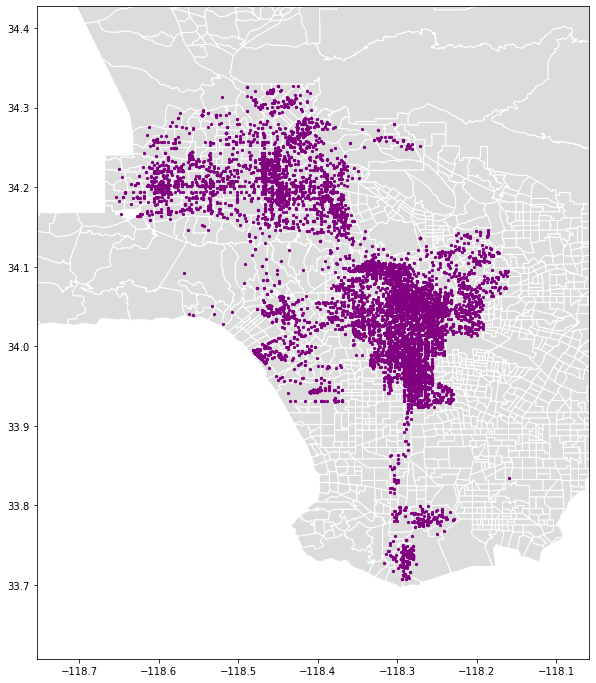

In [33]:
#Print map with within closer boundaries
base = tracts_ejsm.plot(figsize=(12,12),color='gainsboro', edgecolor='white')
ax = crime.plot(ax=base, marker='o', color='purple', markersize=5)
ax.set_xlim(minx - .1, maxx + .1)
ax.set_ylim(miny - .1, maxy + .1)
ax

In [34]:
#Configure coordinate reference system for tracts to join the two dataframes
tracts.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [35]:
#Configure coordinate reference system for crime
crime.set_crs(epsg=4326, inplace=True)
crime.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [36]:
#Join tracts_ejsm and crime data
join = gpd.sjoin(tracts,
                 crime,
                 how='right')

In [37]:
join.head()

,index_left,FIPS,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,...,:@computed_region_tatf_ua23,bkg_date,:@computed_region_ur2y_g4cx,bkg_time,:@computed_region_kqwf_mjcx,bgk_location,:@computed_region_2dna_qi2s,bkg_loc_cd,dispo_desc,geometry
9361,0.0,06037101110,6005984,BOOKING,2020-09-04T00:00:00.000,2250,16,Foothill,1656,24,...,260,2020-09-05T00:00:00.000,18,0218,1,VALLEY - JAIL DIV,7,4279,MISDEMEANOR COMPLAINT FILED,POINT (-118.30020 34.25670)
9593,0.0,06037101110,6009503,BOOKING,2020-09-10T00:00:00.000,1030,16,Foothill,1638,39,...,1270,2020-09-10T00:00:00.000,NaN,1410,1,VALLEY - JAIL DIV,7,4279,MISDEMEANOR COMPLAINT FILED,POINT (-118.29320 34.25780)
9504,0.0,06037101110,5993355,BOOKING,2020-08-16T00:00:00.000,2220,16,Foothill,1638,20,...,1270,2020-08-17T00:00:00.000,NaN,0201,1,VALLEY - JAIL DIV,7,4279,DISTRICT ATTORNEY REJECT,POINT (-118.29300 34.25950)
1140,0.0,06037101110,5960579,BOOKING,2020-06-25T00:00:00.000,1200,16,Foothill,1638,28,...,1270,2020-06-25T00:00:00.000,NaN,1440,1,VALLEY - JAIL DIV,7,4279,849(B)(1) PC/TECHNICAL ARREST,POINT (-118.29300 34.25950)
2877,0.0,06037101110,5979399,BOOKING,2020-07-27T00:00:00.000,0130,16,Foothill,1638,44,...,1270,2020-07-27T00:00:00.000,NaN,0311,1,VALLEY - JAIL DIV,7,4279,MISDEMEANOR COMPLAINT FILED,POINT (-118.29300 34.25950)


In [38]:
join.sample(5)

,index_left,FIPS,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,...,:@computed_region_tatf_ua23,bkg_date,:@computed_region_ur2y_g4cx,bkg_time,:@computed_region_kqwf_mjcx,bgk_location,:@computed_region_2dna_qi2s,bkg_loc_cd,dispo_desc,geometry
5166,299.0,06037135201,5961930,BOOKING,2020-06-27T00:00:00.000,1345,21,Topanga,2143,29,...,1475,2020-06-27T00:00:00.000,NaN,1729,2,VALLEY - JAIL DIV,44,4279,MISDEMEANOR COMPLAINT FILED,POINT (-118.62740 34.18830)
9578,670.0,06037221120,6000297,BOOKING,2020-08-27T00:00:00.000,1530,20,Olympic,2088,31,...,950,2020-08-27T00:00:00.000,NaN,1952,11,METRO - JAIL DIVISION,8,4273,MISDEMEANOR COMPLAINT FILED,POINT (-118.28770 34.04160)
7713,561.0,06037208903,5974681,BOOKING,2020-07-19T00:00:00.000,0715,02,Rampart,0246,26,...,836,2020-07-19T00:00:00.000,NaN,0922,11,METRO - JAIL DIVISION,68,4273,MISDEMEANOR COMPLAINT FILED,POINT (-118.27340 34.05980)
4176,673.0,06037221302,5916250,BOOKING,2020-04-15T00:00:00.000,2140,20,Olympic,2083,35,...,898,2020-04-16T00:00:00.000,NaN,0230,12,METRO - JAIL DIVISION,19,4273,CITY ATTORNEY REJECT,POINT (-118.30900 34.04160)
2636,663.0,06037219700,5973175,BOOKING,2020-07-16T00:00:00.000,1520,03,Southwest,0305,0,...,1361,2020-07-16T00:00:00.000,7,2119,12,77TH ST,17,4212,NaN,POINT (-118.34410 34.03360)


In [39]:
#Subset the data from join
df = pd.DataFrame(join,columns=['arst_date','rpt_id','grp_description','arst_typ_cd','HazScore', 'CIscore','FIPS','lat','lon','geometry'])
print(df)

                    arst_date   rpt_id                 grp_description  \
9361  2020-09-04T00:00:00.000  6005984         Driving Under Influence   
9593  2020-09-10T00:00:00.000  6009503                  Other Assaults   
9504  2020-08-16T00:00:00.000  5993355  Miscellaneous Other Violations   
1140  2020-06-25T00:00:00.000  5960579                  Other Assaults   
2877  2020-07-27T00:00:00.000  5979399                  Other Assaults   
...                       ...      ...                             ...   
9479  2020-08-02T00:00:00.000  5983807  Miscellaneous Other Violations   
9509  2020-09-11T00:00:00.000  6010436         Driving Under Influence   
9652  2020-08-25T00:00:00.000  5999013                         Robbery   
9778  2020-08-24T00:00:00.000  5998508              Aggravated Assault   
9968  2020-09-09T00:00:00.000  6008421         Receive Stolen Property   

     arst_typ_cd  HazScore  CIscore         FIPS      lat        lon  \
9361           M       NaN      NaN  06

In [40]:
#Subset of the joined dataframes 
#We are keeping these columns because our analysis focuses on the HazScore and description of the charges
df.head()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry
9361,2020-09-04T00:00:00.000,6005984,Driving Under Influence,M,NaN,NaN,06037101110,34.2567,-118.3002,POINT (-118.30020 34.25670)
9593,2020-09-10T00:00:00.000,6009503,Other Assaults,M,NaN,NaN,06037101110,34.2578,-118.2932,POINT (-118.29320 34.25780)
9504,2020-08-16T00:00:00.000,5993355,Miscellaneous Other Violations,F,NaN,NaN,06037101110,34.2595,-118.293,POINT (-118.29300 34.25950)
1140,2020-06-25T00:00:00.000,5960579,Other Assaults,F,NaN,NaN,06037101110,34.2595,-118.293,POINT (-118.29300 34.25950)
2877,2020-07-27T00:00:00.000,5979399,Other Assaults,M,NaN,NaN,06037101110,34.2595,-118.293,POINT (-118.29300 34.25950)


Here we follow Yoh’s steps more closely, but the aggravated arrests don’t tell us much. We’re trying to figure out crimes linked explicitly to environmental hazards. For now, we want to keep this large dataset because we want to be able to pick them out later depending on what crimes we want to analyze in the nexus with environmental hazards.

In [41]:
#These are the tracts with the highest number of arrests. We included this as a priliminary step to mapping the full counts. 
crime_by_tracts = join.FIPS.value_counts().rename_axis('Tract').reset_index(name='crime_count')
crime_by_tracts.head()

,Tract,crime_count
0,06037980028,235
1,06037273402,130
2,06037206300,112
3,06037237600,99
4,06037190700,86


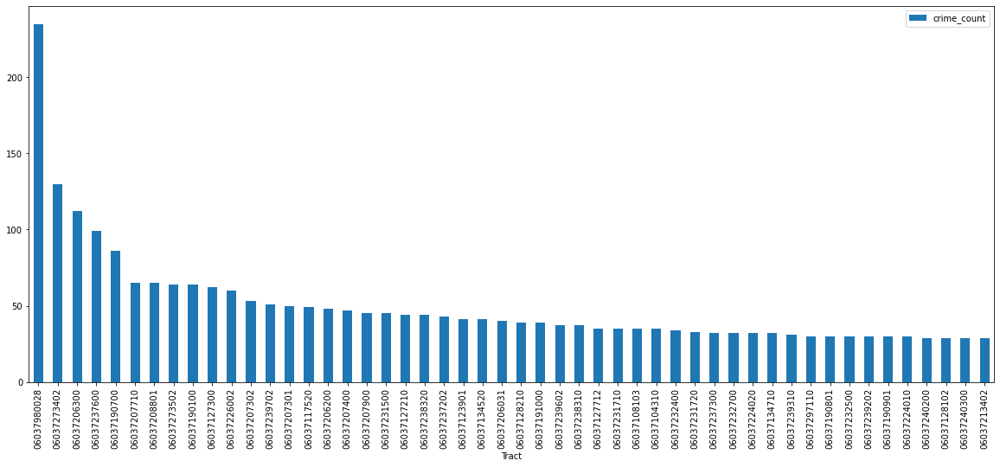

In [42]:
#This is a visualization to compare the amount of arrests in different census tracts
crime_by_tracts[:50].plot.bar(figsize=(20,8),x='Tract',y='crime_count')

This bar graph tells us the crime by census tract, but we can only guess what that is. It would be useful to bring this into the function, but we’re looking for a better way of organizing and visualizing the data. Instead of looking at specific census tracts themselves, our goal is to understand the interconnected relationship between proximity to hazards (such as pollution) and seeing what charges the police are giving people in that area. Surprisingly, the census tract with the most crimes (06037980028) is the one belonging to the airport and in between the Chevron Oil Refinery and the Ballon Wetlands


In [43]:
#Grouped data by the description of arrest. Here, the FIPS out of order because we are descibing a full count of charge descriptions. 
df.groupby(['grp_description']).count()

,arst_date,rpt_id,arst_typ_cd,HazScore,CIscore,FIPS,lat,lon,geometry
grp_description,,,,,,,,,
Against Family/Child,106,106,106,0,0,106,106,106,106
Aggravated Assault,1586,1586,1586,0,0,1575,1586,1586,1586
Burglary,451,451,451,0,0,451,451,451,451
Disorderly Conduct,37,37,37,0,0,37,37,37,37
Disturbing the Peace,6,6,6,0,0,6,6,6,6
Driving Under Influence,1000,1000,1000,0,0,992,1000,1000,1000
Drunkeness,163,163,163,0,0,162,163,163,163
Forgery/Counterfeit,30,30,30,0,0,30,30,30,30
Fraud/Embezzlement,61,61,61,0,0,59,61,61,61


In [44]:
#Group data by the FIPS code to explore the meaning of the counts in each census tract. 
df.groupby(['FIPS']).count()

,arst_date,rpt_id,grp_description,arst_typ_cd,HazScore,CIscore,lat,lon,geometry
FIPS,,,,,,,,,
06037101110,5,5,5,5,0,0,5,5,5
06037101210,3,3,3,3,0,0,3,3,3
06037101220,4,4,4,4,0,0,4,4,4
06037101300,1,1,1,1,0,0,1,1,1
06037101400,2,2,2,2,0,0,2,2,2
...,...,...,...,...,...,...,...,...,...
06037980024,16,16,16,16,0,0,16,16,16
06037980026,2,2,2,2,0,0,2,2,2
06037980028,235,235,226,235,0,0,235,235,235


In [45]:
#Data is grouped for counts of reports in tracts. 
df_grouped=df.groupby(['FIPS','grp_description','lat','lon','arst_date']).count()[['rpt_id']]
df_grouped.head(50)

rpt_id
FIPS        grp_description                lat     lon       arst_date                      
06037101110 Driving Under Influence        34.2567 -118.3002 2020-09-04T00:00:00.000       1
            Miscellaneous Other Violations 34.2595 -118.293  2020-08-16T00:00:00.000       1
            Other Assaults                 34.2578 -118.2932 2020-09-10T00:00:00.000       1
                                           34.2595 -118.293  2020-06-25T00:00:00.000       1
                                                             2020-07-27T00:00:00.000       1
06037101210 Aggravated Assault             34.2523 -118.2874 2020-06-21T00:00:00.000       1
                                                             2020-07-15T00:00:00.000       1
                                           34.2544 -118.286  2020-07-26T00:00:00.000       1
06037101220 Aggravated Assault             34.252  -118.2835 2020-07-01T00:00:00.000       1
                                           34.2539 -118.2814 2020-09-19T00:00:00.000       1
            Burglary                       34.2478 -118.2818 2020-07-27T00:00:00.000       1
            Miscellaneous Other Violations 34.25   -118.2846 2020-07-29T00:00:00.000       1
06037101300 Aggravated Assault             34.2519 -118.2713 2020-06-24T00:00:00.000       1
06037101400 Narcotic Drug Laws             34.2486 -118.2886 2020-05-17T00:00:00.000       1
            Other Assaults                 34.252  -118.2955 2020-06-22T00:00:00.000       1
06037102103 Driving Under Influence        34.2268 -118.3631 2020-09-17T00:00:00.000       1
            Narcotic Drug Laws             34.2237 -118.3547 2020-07-05T00:00:00.000       1
            Weapon (carry/poss)            34.2268 -118.3631 2020-07-18T00:00:00.000       1
06037102104 Narcotic Drug Laws             34.2201 -118.3489 2020-06-28T00:00:00.000       1
            Vehicle Theft                  34.2123 -118.3485 2020-04-18T00:00:00.000       1
06037102107 Aggravated Assault             34.2397 -118.3661 2020-07-04T00:00:00.000       1
            Larceny                        34.2512 -118.3421 2020-07-27T00:00:00.000       1
06037103102 Driving Under Influence        34.2633 -118.3157 2020-06-29T00:00:00.000       1
            Larceny                        34.2634 -118.3074 2020-01-31T00:00:00.000       1
            Weapon (carry/poss)            34.2633 -118.3105 2020-07-23T00:00:00.000       1
06037103200 Aggravated Assault             34.2724 -118.3243 2020-08-16T00:00:00.000       1
            Gambling                       34.2598 -118.3224 2020-09-17T00:00:00.000       9
            Larceny                        34.2724 -118.3243 2020-09-17T00:00:00.000       1
            Narcotic Drug Laws             34.2598 -118.3224 2020-09-12T00:00:00.000       1
                                           34.2615 -118.3258 2020-09-17T00:00:00.000       1
                                           34.2732 -118.3443 2020-07-02T00:00:00.000       1
            Other Assaults                 34.2598 -118.3297 2020-06-23T00:00:00.000       1
                                           34.2634 -118.3201 2020-07-01T00:00:00.000       1
            Vehicle Theft                  34.2598 -118.3297 2020-06-23T00:00:00.000       1
                                           34.2615 -118.3214 2020-09-23T00:00:00.000       1
            Weapon (carry/poss)            34.2724 -118.3243 2020-07-06T00:00:00.000       1
06037103300 Driving Under Influence        34.2562 -118.3588 2020-07-04T00:00:00.000       1
            Vehicle Theft                  34.2562 -118.3588 2020-07-30T00:00:00.000       1
06037103400 Miscellaneous Other Violations 34.2596 -118.3052 2020-07-01T00:00:00.000       1
            Narcotic Drug Laws             34.2596 -118.3038 2020-07-04T00:00:00.000       3
            Other Assaults                 34.2578 -118.314  2020-07-10T00:00:00.000       1
06037104103 Aggravated Assault             34.2824 -118.3883 2020-02-24T00:00:00.000   

In [46]:
#Flatten data to prep for bar graph and reset the index to include the group values 
df_flat = df_grouped.reset_index()
df_flat

,FIPS,grp_description,lat,lon,arst_date,rpt_id
0,06037101110,Driving Under Influence,34.2567,-118.3002,2020-09-04T00:00:00.000,1
1,06037101110,Miscellaneous Other Violations,34.2595,-118.293,2020-08-16T00:00:00.000,1
2,06037101110,Other Assaults,34.2578,-118.2932,2020-09-10T00:00:00.000,1
3,06037101110,Other Assaults,34.2595,-118.293,2020-06-25T00:00:00.000,1
4,06037101110,Other Assaults,34.2595,-118.293,2020-07-27T00:00:00.000,1
...,...,...,...,...,...,...
8547,06037980031,Sex (except rape/prst),33.7613,-118.2819,2020-06-20T00:00:00.000,1
8548,06037980031,Vehicle Theft,33.7167,-118.2842,2020-06-25T00:00:00.000,1
8549,06037980031,Vehicle Theft,33.7266,-118.2766,2020-07-03T00:00:00.000,1
8550,06037980031,Weapon (carry/poss),33.7489,-118.2798,2020-07-01T00:00:00.000,1


Look at how beautiful that index is. What is not shown in our flattened data frame is the amount of blood and tears (and lots of green tea caffeine) that helped us get to this point. Originally while our workflow was simple, things became more complicated as we tried to clean up our notebooks without taking away code that would serve us moving forward. This data frame allows us to see all types of crimes and arrest data across census tracts and their location. This provides us with the top-most layer for our future maps, in addition to a versatile data frame that can give temporal nuance to our maps, an attribute especially useful for the Kepler map. 

In [47]:
#Make plotly bar graph
px.bar(df_flat,
       x='grp_description',
       y='rpt_id',
       title='Description of LAPD Arrests in 2020',
       color='grp_description',
       labels={'grp_description':'Arrest Decription','rpt_id':'Number of Arrests'}
      )

So far, so good. It was tricky to make sense of all these numbers, but having everything cleanly indexed would provide us more than enough for what we needed. Looking back now, we would like to have examined a larger sample, but based on our gigabyte limit on Jupyter Hub, we were unsure how far to push this. From this bar graph, it becomes clear that aggravated assault, driving under the influence, and other crimes are the largest ones. We’re trying to focus on aggravated assault, disturbing the peace, and disorderly contact, because these are the ones we believe can connect policing to proximity to hazards (the ejsm score). It’s clear that aggravated assault is the largest sample; there are significantly less for disorderly conduct and disturbing the peace. For now, we don’t know if this will affect the statistical significance of our findings later on. 

In [48]:
#Define the merged dataframe
df_ejsm = tracts_ejsm.merge(df_flat,on="FIPS")
df_ejsm.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 8547 entries, 0 to 8546
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   FIPS             8547 non-null   object  
 1   geometry         8547 non-null   geometry
 2   OBJECTID         8547 non-null   int64   
 3   CIscore          8547 non-null   int64   
 4   HazScore         8547 non-null   int64   
 5   HealthScore      8547 non-null   int64   
 6   SVscore          8547 non-null   int64   
 7   CCVscore         8547 non-null   int64   
 8   Shape__Area      8547 non-null   float64 
 9   Shape__Length    8547 non-null   float64 
 10  grp_description  8547 non-null   object  
 11  lat              8547 non-null   object  
 12  lon              8547 non-null   object  
 13  arst_date        8547 non-null   object  
 14  rpt_id           8547 non-null   int64   
dtypes: float64(2), geometry(1), int64(7), object(5)
memory usage: 1.0+ MB


In [49]:
#Convert lat and lon to floats intergrating arrest and EJSM score data
df_ejsm['lat'] = df_ejsm['lat'].astype(float)
df_ejsm['lon'] = df_ejsm['lon'].astype(float)
df_ejsm.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 8547 entries, 0 to 8546
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   FIPS             8547 non-null   object  
 1   geometry         8547 non-null   geometry
 2   OBJECTID         8547 non-null   int64   
 3   CIscore          8547 non-null   int64   
 4   HazScore         8547 non-null   int64   
 5   HealthScore      8547 non-null   int64   
 6   SVscore          8547 non-null   int64   
 7   CCVscore         8547 non-null   int64   
 8   Shape__Area      8547 non-null   float64 
 9   Shape__Length    8547 non-null   float64 
 10  grp_description  8547 non-null   object  
 11  lat              8547 non-null   float64 
 12  lon              8547 non-null   float64 
 13  arst_date        8547 non-null   object  
 14  rpt_id           8547 non-null   int64   
dtypes: float64(4), geometry(1), int64(7), object(3)
memory usage: 1.0+ MB


In [50]:
#Convert dataframe to crs
df_ejsm.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [51]:
#Create basic scatter of df_ejsm_crime_tracts data with coordinate reference system
px.scatter(df_ejsm,
           x='lon',
           y='lat'
          )

In [52]:
#Exploring map styles using mapbox
fig = px.scatter_mapbox(df_ejsm,
                        lat='lat',
                        lon='lon',
                        mapbox_style="stamen-terrain")
fig.show()

In [53]:
#Make temporal scatter plot map
fig = px.scatter_mapbox(df_ejsm, 
                        lat="lat", 
                        lon="lon", 
                        color="grp_description",
                        animation_frame = 'arst_date',
                       )
fig.update_layout(mapbox_style="carto-darkmatter")

fig.show()

In [54]:
#import kepler 
from keplergl import KeplerGl

In [55]:
#make base map from reference
map = KeplerGl(height=600,width=800)
map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(height=600)

In [56]:
#tracts_ejsm have no attribute string
map.add_data(data=df_ejsm,name='EJSM')

#At this point, we were stumped. We were clueless as to how our Kepler map was not fully functioning. In previous iterations, we were able to add on our merged data, but in this case, something has occurred in between our workflows where we couldn’t figure out the discrepancy. The first time around, we thought the geometry was converted to an object instead of remaining as geometry, and we were able to correct this. But even then, Kepler went unchanged. Though it had been simple, something occurred when we merged notebooks, and we still haven’t figured out why df_ejsm won’t work on Kepler even though it has a geometry file and the coordinates have been converted appropriately. After we went back, we realized we had merged the wrong tract files, and once we corrected ejsm_tracts to tracts, the rest of the notebook fell into place.  

In [57]:
import contextily as ctx

In [58]:
census_tracts = tracts_ejsm[['FIPS','HazScore','geometry']]
census_tracts.head()
census_tracts.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2342 entries, 0 to 2341
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   FIPS      2342 non-null   object  
 1   HazScore  2342 non-null   int64   
 2   geometry  2342 non-null   geometry
dtypes: geometry(1), int64(1), object(1)
memory usage: 73.2+ KB


In [59]:
census_tracts = census_tracts.to_crs(epsg=3857)

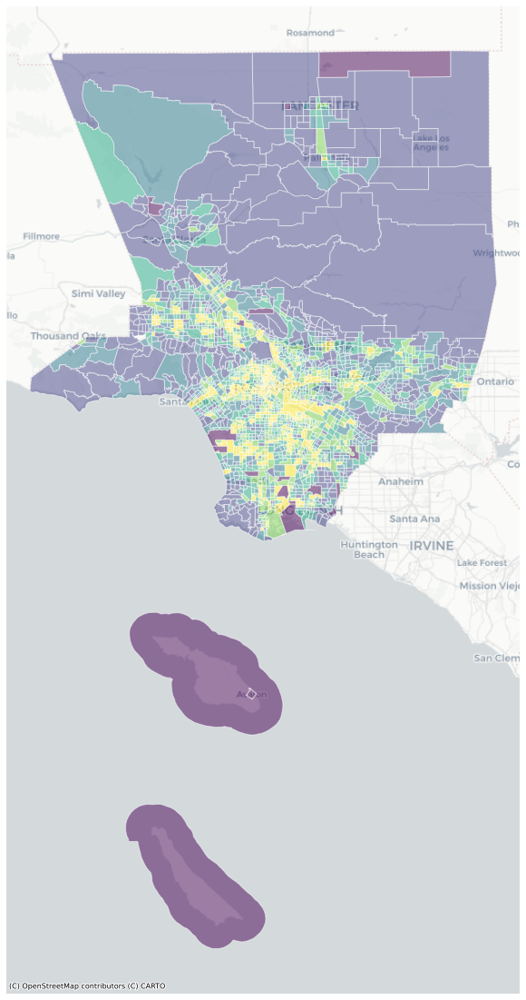

In [60]:
#Use census tracts and ejsm integrated layers to add base map
ax=census_tracts.plot(figsize=(20,20), 
                      edgecolor='white',
                      column='HazScore',
                      alpha=0.5)

ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [61]:
#Make crime GeoDataFrame
crime = gpd.GeoDataFrame(df_flat, 
                         crs='EPSG:4326',
                         geometry=gpd.points_from_xy(df_flat.lon, df_flat.lat))

In [62]:
#Convert crime to crs
crime = crime.to_crs(epsg=3857)
crime.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8552 entries, 0 to 8551
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   FIPS             8552 non-null   object  
 1   grp_description  8552 non-null   object  
 2   lat              8552 non-null   object  
 3   lon              8552 non-null   object  
 4   arst_date        8552 non-null   object  
 5   rpt_id           8552 non-null   int64   
 6   geometry         8552 non-null   geometry
dtypes: geometry(1), int64(1), object(5)
memory usage: 467.8+ KB


In [63]:
#Use geometry to define area
crime.geometry.total_bounds

array([-13208458.33278877,   3989526.81108362, -13153388.58069333,
         4072849.02638646])

In [64]:
#Print total bounds
minx, miny, maxx, maxy = crime.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13208458.332788765
-13153388.580693332
3989526.8110836204
4072849.0263864617


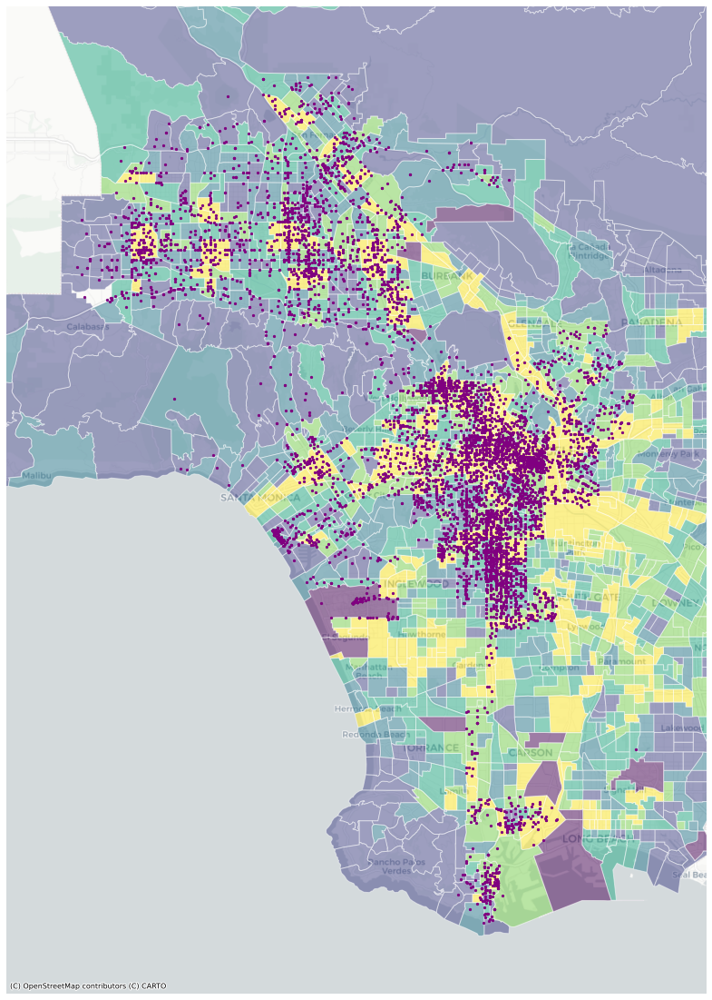

In [65]:
#Configure function map by census tracts as the base map
base = census_tracts.plot(figsize=(20,20), 
                      edgecolor='white',
                      column='HazScore',
                      alpha=0.5)

ax = crime.plot(ax=base, marker='o', color='purple', markersize=5)

ax.set_xlim(minx - 7000, maxx + 7000) 
ax.set_ylim(miny - 7000, maxy + 7000)

ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)


In [66]:
#Define bounds for the map using the function
crime.geometry.total_bounds
minx, miny, maxx, maxy = crime.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13208458.332788765
-13153388.580693332
3989526.8110836204
4072849.0263864617


In [67]:
def map_arrests_by_type(charge='Aggravated Assault'):
    
    crime_type = crime[crime.grp_description==charge]

    minx, miny, maxx, maxy = crime_type.geometry.total_bounds
    
    arrests_in_tracts = gpd.sjoin(census_tracts,crime_type,how='inner')

    base = census_tracts.plot(figsize=(20,20), 
                    edgecolor='white',
                    column='HazScore',
                    alpha=0.5)

    ax = arrests_in_tracts.plot(ax=base, 
                                    column='grp_description',
                                    marker='o',
                                    markersize=40, 
                                    legend=True,
                                    cmap='tab20',
                                    legend_kwds={
                                       'loc': 'upper right',
                                       'bbox_to_anchor':(1.3,1)
                                    }                  # this puts the legend to the side
                                )

    ax.set_xlim(minx - 200, maxx + 200) # added/substracted value is to give some margin around total bounds
    ax.set_ylim(miny - 200, maxy + 200)

    ax.axis('off')

    ax.set_title('Occurences of '+crime.grp_description.values[0]+' in Los Angeles',fontsize=20)

    ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
    ax

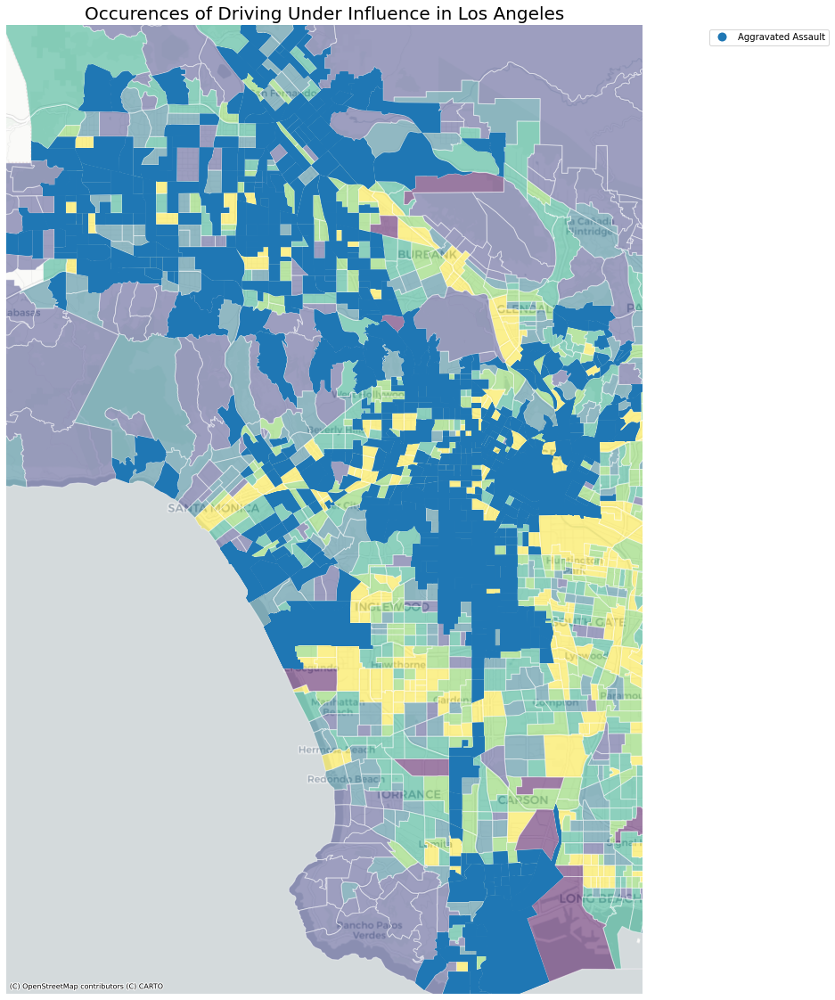

In [68]:
#Map arrests by using the function
map_arrests_by_type(charge='Aggravated Assault')

At this point, we reached a dilemma. After extensive back and forth, we were unable to get the map to filter the crime points by type. Instead, it highlighted all the census tracts where these crimes had occurred. We had to stop and reassess our workflow since we weren’t making any progress and repeating previous issues. Our goal for our function was for the large map to show all the points we wanted so that rather than zooming in on a place, we instead see where crimes were committed by type and identify where certain crimes occurred more than others. Alas, we were still able to understand more. In previous iterations, we created a line of code using ".isin", though we also found that it aggregated the crimes we were trying to isolate.

Division of labor
DH: Finalized notebooks, explored data, imported maps, coordinated with Andres to troubleshoot, indexed data and dataframes
AG: Visualized some of the interactive maps, including Kepler; co-ordinated with Dani to troubleshoot function; Multiple overlays